In [79]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt # parameters of plots
import seaborn as sns # plots

from fbprophet import Prophet # forecasting
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from sklearn.metrics import mean_squared_error
from math import sqrt

import datetime as dt

import warnings
from time import process_time

pd.set_option('max_row', 30, 'max_columns', None)

# Load the Data

In [2]:
# housing data
houses = pd.read_csv('houses.csv')

# unemployment data for 2018 from https://www.bls.gov/lau/#cntyaa
unemployment = pd.read_csv('laucnty18.csv')

# demographic data for 2018 compiled from https://zipwho.com/?zip=22740&city=Plainfield&filters=--_--_--_--&state=IL&mode=zip
demo = pd.read_csv('demo.csv')

## Data Cleaning

In [3]:
# Don't need data from 1996 or some categorical variables in houses
columns_to_drop = ['RegionID', 'RegionType', '1/31/96', '2/29/96', '3/31/96', '4/30/96', '5/31/96', '6/30/96', '7/31/96', '8/31/96', '9/30/96', '10/31/96', '11/30/96', '12/31/96']
houses.drop(columns_to_drop, axis = 1, inplace = True)

In [4]:
# need to convert to string first - makes sense, don't do math with zip
houses['RegionName'] = houses['RegionName'].apply(str)

# find all zips 3 digits long - these are invalid zips
idx_to_drop = houses.loc[houses['RegionName'].str.len() < 4].index

#idx_to_drop 
houses.drop(idx_to_drop, axis = 0, inplace = True)

# reindex because of dropped columns
houses.index = range(len(houses))

In [5]:
# add 0s to the 4 digit zips in New England - any other 4 digit zips are invalid
for i in range(len(houses)):
    if houses['State'][i] in ['CT', 'MA', 'ME', 'NH', 'NJ', 'RI', 'VT'] and len(houses['RegionName'][i]) < 5:
        zcode = houses['RegionName'][i]
        new_zcode = zcode.zfill(5)
        houses['RegionName'][i] = new_zcode

In [6]:
# need to split up county name/state abrreviation into two columns
# county
unemployment['county'] = unemployment['County Name/State Abbreviation'].str.extract('([A-z]+ [A-z]+)')
# state postal abbreviations
unemployment['state'] = unemployment['County Name/State Abbreviation'].str.extract('([A-Z]{2})')

# convert counties to lower for easier matching
unemployment['county'] = unemployment['county'].str.lower()
houses['CountyName'] = houses['CountyName'].str.lower()

In [227]:
# drop counties in Puerto Rico - interested in US states
unemployment = unemployment.loc[unemployment['state'] != 'PR']

In [224]:
unemployment.head()

,LAUSCode,StateCode,CountyCode,County Name/State Abbreviation,year,labor _force,employed,unemployed,unemployment_rate,county,state
0,CN0100100000000,1.0,1.0,"Autauga County, AL",2018.0,"25,957","25,015",942,3.6,autauga county,AL
1,CN0100300000000,1.0,3.0,"Baldwin County, AL",2018.0,"93,849","90,456","3,393",3.6,baldwin county,AL
2,CN0100500000000,1.0,5.0,"Barbour County, AL",2018.0,"8,373","7,940",433,5.2,barbour county,AL
3,CN0100700000000,1.0,7.0,"Bibb County, AL",2018.0,"8,661","8,317",344,4.0,bibb county,AL
4,CN0100900000000,1.0,9.0,"Blount County, AL",2018.0,"25,006","24,128",878,3.5,blount county,AL


In [7]:
# drop all counties with higher than average unemployment 
# don't want to invest there - there are better opportunities
labor = unemployment.loc[unemployment['unemployment_rate'] < unemployment['unemployment_rate'].mean()]
labor.index = range(len(labor))

# Data Exploration

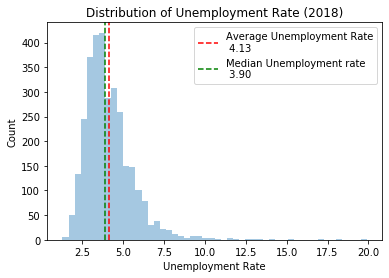

(83, 2)


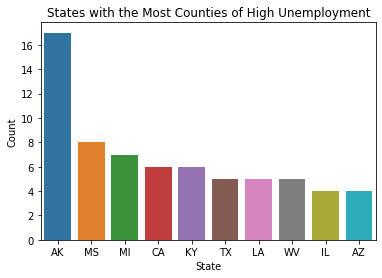

In [244]:
# distribution of unemployment rate
plt.figure()
sns.distplot(unemployment['unemployment_rate'], kde = False)
plt.axvline(unemployment['unemployment_rate'].mean(), 
            color = 'red',
            linestyle = '--',
           label = 'Average Unemployment Rate\n %.2f' % unemployment['unemployment_rate'].mean())
plt.axvline(unemployment['unemployment_rate'].median(),
           color = 'green',
           linestyle = '--',
           label = 'Median Unemployment rate\n %.2f' % unemployment['unemployment_rate'].median())
plt.title('Distribution of Unemployment Rate (2018)')
plt.xlabel('Unemployment Rate')
plt.ylabel('Count')
plt.legend(loc = 'best')
plt.show()

# states with many counties of high unemployment
high_unemp = pd.DataFrame(unemployment[['county', 'state']].loc[unemployment['unemployment_rate'] > 7.5])
print(high_unemp.shape)
plt.figure()
sns.countplot(x = 'state', data = high_unemp,
             order = high_unemp['state'].value_counts()[:10].index)
plt.title('States with the Most Counties of High Unemployment')
plt.xlabel('State')
plt.ylabel('Count')

plt.show()

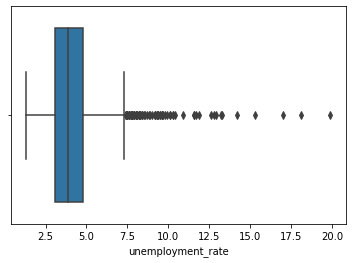

In [230]:
sns.boxplot(unemployment['unemployment_rate'])
plt.show()

(83, 2)


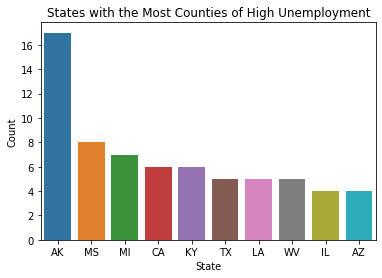

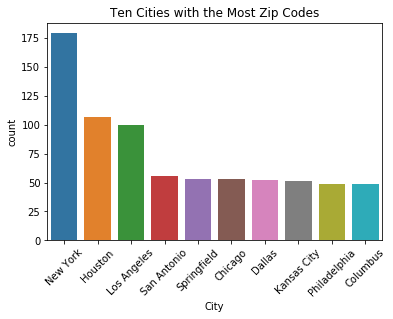

In [196]:
# top 10 cities in houses data
sns.countplot(x = 'City', data = houses, 
              order = houses['City'].value_counts()[:10].index)
plt.xticks(rotation = '45')
plt.title('Ten Cities with the Most Zip Codes')
plt.show()

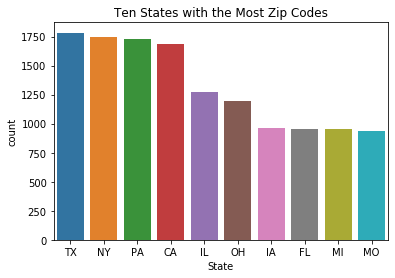

In [198]:
# top 10 states in houses data
plt.figure()
sns.countplot(x = 'State', data = houses, 
              order = houses['State'].value_counts()[:10].index)
#plt.xticks(rotation = '45')
plt.title('Ten States with the Most Zip Codes')
plt.show()

In [161]:
houses.head()

,SizeRank,RegionName,StateName,State,City,Metro,CountyName,1/31/97,2/28/97,3/31/97,4/30/97,5/31/97,6/30/97,7/31/97,8/31/97,9/30/97,10/31/97,11/30/97,12/31/97,1/31/98,2/28/98,3/31/98,4/30/98,5/31/98,6/30/98,7/31/98,8/31/98,9/30/98,10/31/98,11/30/98,12/31/98,1/31/99,2/28/99,3/31/99,4/30/99,5/31/99,6/30/99,7/31/99,8/31/99,9/30/99,10/31/99,11/30/99,12/31/99,1/31/00,2/29/00,3/31/00,4/30/00,5/31/00,6/30/00,7/31/00,8/31/00,9/30/00,10/31/00,11/30/00,12/31/00,1/31/01,2/28/01,3/31/01,4/30/01,5/31/01,6/30/01,7/31/01,8/31/01,9/30/01,10/31/01,11/30/01,12/31/01,1/31/02,2/28/02,3/31/02,4/30/02,5/31/02,6/30/02,7/31/02,8/31/02,9/30/02,10/31/02,11/30/02,12/31/02,1/31/03,2/28/03,3/31/03,4/30/03,5/31/03,6/30/03,7/31/03,8/31/03,9/30/03,10/31/03,11/30/03,12/31/03,1/31/04,2/29/04,3/31/04,4/30/04,5/31/04,6/30/04,7/31/04,8/31/04,9/30/04,10/31/04,11/30/04,12/31/04,1/31/05,2/28/05,3/31/05,4/30/05,5/31/05,6/30/05,7/31/05,8/31/05,9/30/05,10/31/05,11/30/05,12/31/05,1/31/06,2/28/06,3/31/06,4/30/06,5/31/06,6/30/06,7/31/06,8/31/06,9/30/06,10/31/06,11/30/06,12/31/06,1/31/07,2/28/07,3/31/07,4/30/07,5/31/07,6/30/07,7/31/07,8/31/07,9/30/07,10/31/07,11/30/07,12/31/07,1/31/08,2/29/08,3/31/08,4/30/08,5/31/08,6/30/08,7/31/08,8/31/08,9/30/08,10/31/08,11/30/08,12/31/08,1/31/09,2/28/09,3/31/09,4/30/09,5/31/09,6/30/09,7/31/09,8/31/09,9/30/09,10/31/09,11/30/09,12/31/09,1/31/10,2/28/10,3/31/10,4/30/10,5/31/10,6/30/10,7/31/10,8/31/10,9/30/10,10/31/10,11/30/10,12/31/10,1/31/11,2/28/11,3/31/11,4/30/11,5/31/11,6/30/11,7/31/11,8/31/11,9/30/11,10/31/11,11/30/11,12/31/11,1/31/12,2/29/12,3/31/12,4/30/12,5/31/12,6/30/12,7/31/12,8/31/12,9/30/12,10/31/12,11/30/12,12/31/12,1/31/13,2/28/13,3/31/13,4/30/13,5/31/13,6/30/13,7/31/13,8/31/13,9/30/13,10/31/13,11/30/13,12/31/13,1/31/14,2/28/14,3/31/14,4/30/14,5/31/14,6/30/14,7/31/14,8/31/14,9/30/14,10/31/14,11/30/14,12/31/14,1/31/15,2/28/15,3/31/15,4/30/15,5/31/15,6/30/15,7/31/15,8/31/15,9/30/15,10/31/15,11/30/15,12/31/15,1/31/16,2/29/16,3/31/16,4/30/16,5/31/16,6/30/16,7/31/16,8/31/16,9/30/16,10/31/16,11/30/16,12/31/16,1/31/17,2/28/17,3/31/17,4/30/17,5/31/17,6/30/17,7/31/17,8/31/17,9/30/17,10/31/17,11/30/17,12/31/17,1/31/18,2/28/18,3/31/18,4/30/18,5/31/18,6/30/18,7/31/18,8/31/18,9/30/18,10/31/18,11/30/18,12/31/18,1/31/19,2/28/19,3/31/19,4/30/19,5/31/19,6/30/19,7/31/19,8/31/19,9/30/19,10/31/19,11/30/19,12/31/19,1/31/20,2/29/20,3/31/20
0,0,10025,NY,NY,New York,New York-Newark-Jersey City,new york county,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1513130.0,1521683.0,1520682.0,1526830.0,1529485.0,1536433.0,1549683.0,1575387.0,1603481.0,1628358.0,1647174.0,1677270.0,1711039.0,1731261.0,1742661.0,1744659.0,1752491.0,1761396.0,1761418.0,1752466.0,1737604.0,1728035.0,1728620.0,1729029.0,1739112.0,1763236.0,1807891.0,1844852.0,1891031.0,1917748.0,1945902.0,1946427.0,1952705.0,1962646.0,1963763.0,1935978.0,1879272.0,1826374.0,1797482.0,1808533.0,1793061.0,1789234.0,1774025.0,1778993.0,1777666.0,1766556.0,1781261.0,1799355.0,1824332.0,1836146.0,1820240.0,1787200.0,1768065.0,1750443.0,1729579.0,1715226.0,1699360.0,1700752.0,1670557.0,1659907.0,1659546.0,1659127.0,1651553.0,1626469.0,1604759.0,1577065.0,1568355.0,1545001.0,1515587.0,1460274.0,1418673.0,1378803.0,1338370.0,1305944.0,1296545.0,1307422.0,1323813.0,1342134.0,1355324.0,1375884.0,1398247.0,1425750.0,1460487.0,1488138.0,1523802.0,1543959.0,1543569.0,1527294.0,1500319.0,1478072.0,1462476.0,1450278.0,1448073.0,1451664.0,1444152.0,1439274.0,1426356.0,1424684.0,1426351.0,1423922.0,1428421.0,1434591.0,1430589.0,1419893.0,1409134.0,1398604.0,1389905.0,1368229.0,1352148.0,1346534.0,1336331.0,1338122.0,1332032.0,1329686.0,1326840.0,1320823.0,1314399.0,1312967.0,1324563.0,1343606.0,1351002.0,1341207.0,1346056.0,1347846.0,1354286.0,1

# Time Series

In [8]:
# get all#  the arkansas data
ar = houses.copy()
ar = ar.loc[ar['StateName'] == 'AR']

# get the cities of interest
cities = ar.copy()
cities = cities.loc[cities['City'].isin(['Hot Springs', 'Little Rock', 'Fayetteville', 'Searcy'])]

In [23]:
# check for missing values
cities.isna().sum().sum()

10

In [24]:
cities[cities.isna().any(axis = 1)]

,SizeRank,RegionName,StateName,State,City,Metro,CountyName,1/31/97,2/28/97,3/31/97,4/30/97,5/31/97,6/30/97,7/31/97,8/31/97,9/30/97,10/31/97,11/30/97,12/31/97,1/31/98,2/28/98,3/31/98,4/30/98,5/31/98,6/30/98,7/31/98,8/31/98,9/30/98,10/31/98,11/30/98,12/31/98,1/31/99,2/28/99,3/31/99,4/30/99,5/31/99,6/30/99,7/31/99,8/31/99,9/30/99,10/31/99,11/30/99,12/31/99,1/31/00,2/29/00,3/31/00,4/30/00,5/31/00,6/30/00,7/31/00,8/31/00,9/30/00,10/31/00,11/30/00,12/31/00,1/31/01,2/28/01,3/31/01,4/30/01,5/31/01,6/30/01,7/31/01,8/31/01,9/30/01,10/31/01,11/30/01,12/31/01,1/31/02,2/28/02,3/31/02,4/30/02,5/31/02,6/30/02,7/31/02,8/31/02,9/30/02,10/31/02,11/30/02,12/31/02,1/31/03,2/28/03,3/31/03,4/30/03,5/31/03,6/30/03,7/31/03,8/31/03,9/30/03,10/31/03,11/30/03,12/31/03,1/31/04,2/29/04,3/31/04,4/30/04,5/31/04,6/30/04,7/31/04,8/31/04,9/30/04,10/31/04,11/30/04,12/31/04,1/31/05,2/28/05,3/31/05,4/30/05,5/31/05,6/30/05,7/31/05,8/31/05,9/30/05,10/31/05,11/30/05,12/31/05,1/31/06,2/28/06,3/31/06,4/30/06,5/31/06,6/30/06,7/31/06,8/31/06,9/30/06,10/31/06,11/30/06,12/31/06,1/31/07,2/28/07,3/31/07,4/30/07,5/31/07,6/30/07,7/31/07,8/31/07,9/30/07,10/31/07,11/30/07,12/31/07,1/31/08,2/29/08,3/31/08,4/30/08,5/31/08,6/30/08,7/31/08,8/31/08,9/30/08,10/31/08,11/30/08,12/31/08,1/31/09,2/28/09,3/31/09,4/30/09,5/31/09,6/30/09,7/31/09,8/31/09,9/30/09,10/31/09,11/30/09,12/31/09,1/31/10,2/28/10,3/31/10,4/30/10,5/31/10,6/30/10,7/31/10,8/31/10,9/30/10,10/31/10,11/30/10,12/31/10,1/31/11,2/28/11,3/31/11,4/30/11,5/31/11,6/30/11,7/31/11,8/31/11,9/30/11,10/31/11,11/30/11,12/31/11,1/31/12,2/29/12,3/31/12,4/30/12,5/31/12,6/30/12,7/31/12,8/31/12,9/30/12,10/31/12,11/30/12,12/31/12,1/31/13,2/28/13,3/31/13,4/30/13,5/31/13,6/30/13,7/31/13,8/31/13,9/30/13,10/31/13,11/30/13,12/31/13,1/31/14,2/28/14,3/31/14,4/30/14,5/31/14,6/30/14,7/31/14,8/31/14,9/30/14,10/31/14,11/30/14,12/31/14,1/31/15,2/28/15,3/31/15,4/30/15,5/31/15,6/30/15,7/31/15,8/31/15,9/30/15,10/31/15,11/30/15,12/31/15,1/31/16,2/29/16,3/31/16,4/30/16,5/31/16,6/30/16,7/31/16,8/31/16,9/30/16,10/31/16,11/30/16,12/31/16,1/31/17,2/28/17,3/31/17,4/30/17,5/31/17,6/30/17,7/31/17,8/31/17,9/30/17,10/31/17,11/30/17,12/31/17,1/31/18,2/28/18,3/31/18,4/30/18,5/31/18,6/30/18,7/31/18,8/31/18,9/30/18,10/31/18,11/30/18,12/31/18,1/31/19,2/28/19,3/31/19,4/30/19,5/31/19,6/30/19,7/31/19,8/31/19,9/30/19,10/31/19,11/30/19,12/31/19,1/31/20,2/29/20,3/31/20
19278,19967,72201,AR,AR,Little Rock,Little Rock-North Little Rock-Conway,pulaski county,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137782.0,139759.0,140435.0,143754.0,146700.0,148620.0,150786.0,152498.0,154484.0,154658.0,155375.0,156763.0,157415.0,157264.0,157606.0,156883.0,155663.0,155941.0,156232.0,157281.0,158492.0,161461.0,162304.0,160919.0,159532.0,157999.0,158175.0,157360.0,158793.0,160044.0,160520.0,160139.0,158314.0,157786.0,159415.0,162851.0,167913.0,174225.0,180117.0,186320.0,190407.0,193123.0,195317.0,198110.0,201423.0,204431.0,206852.0,209725.0,211752.0,213861.0,215514.0,217419.0,216237.0,213956.0,212017.0,211587.0,211315.0,209630.0,205738.0,200880.0,196930.0,193535.0,191584.0,188975.0,190161.0,192422.0,195531.0,195977.0,195622.0,194509.0,197566.0,201151.0,203105.0,202678.0,200487.0,201714.0,202020.0,202353.0,201246.0,202147.0,203451.0,206477.0,206764.0,207678.0,208542.0,212591.0,218645.0,222139.0,224128.0,223461.0,224550.0,226493.0,232578.0,237563.0,243051.0,246091.0,250316.0,252627.0,251955.0,253050.0,256037.0,263325.0,269760.0,272598.0,270885.0,268108.0,265519.0,266941.0,268221.0,271234.0,274302.0,275253.0,276949.0,277458.0,278263.0,280637.0,283662.0,289829.0,295343.0,298218.0,299233.0,298768.0,300848.0,304337.0,305141.0,305209.0,304234.0,305539.0,306777.0,306816.0,307462.0,309026.0,310828.0,311087.0,308588.0,306268.0,304145.0,303723.0,303760.0,301667.0,296566.0,291137.0,286788.0,282525.0,278785.0,277083.0,278373.0,278100.0,279354.0,280030.0,279237.0,278139.0,280402.0,284053.0,285708.0,283912.0,282658.0,281346.0,280409.0,279375.0,277104.0,273590.0,274276.0,274743.0,274386.0,270249.0,267744.0,268272.0,

In [26]:
# fill in missing values with average of that metro area in that year
for i in cities.loc[:,'1/31/97':'3/31/20']:
    cities[i] = cities[i].fillna(cities.groupby('CountyName')[i].transform('mean'))

# check for missing values
cities.isna().sum().sum()

0

Create a time series plot of house prices for the four metro areas 1997 to present, average at the metro level.

In [27]:
# group the data by 'Metro' find the mean and transpose for the time series
ar_ts = cities.groupby('Metro').mean().transpose()

# drop SizeRank - unnecessary for this time series
ar_ts.drop('SizeRank', inplace = True)

# convert the index to datetime format
ar_ts.index = pd.to_datetime(ar_ts.index)

# find average house price of each Metro area for each year
ar_plotdf = ar_ts.groupby(ar_ts.index.year).mean()

# define the year variable for x-axis
ar_plotdf['year'] = ar_plotdf.index

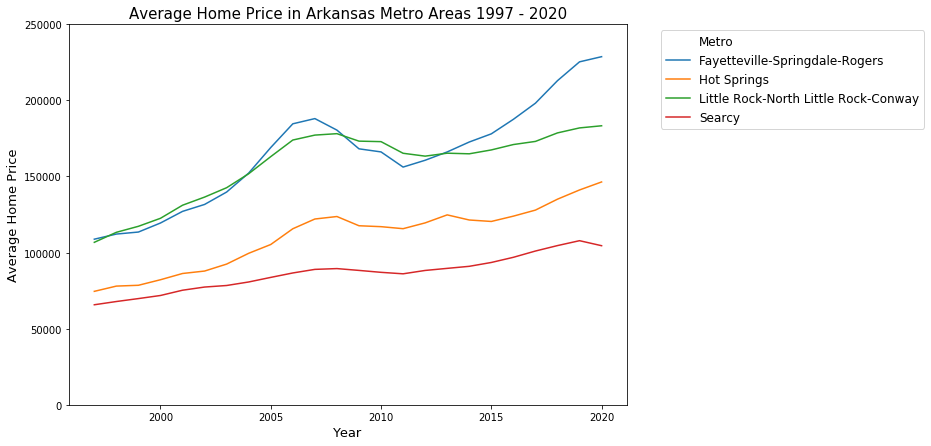

In [30]:
# plot the time series over all years

# melt the dataframe to get a long format
ar = ar_plotdf.melt(id_vars = 'year')
plt.figure(figsize = (10,7))
sns.lineplot(x = 'year', y = 'value', hue = 'Metro', data = ar)
plt.ylim(0, 250000)
plt.ylabel('Average Home Price', size = 13)
plt.xlabel('Year', size = 13)
plt.title('Average Home Price in Arkansas Metro Areas 1997 - 2020', size = 15)
plt.legend(bbox_to_anchor = (1.05, 1), prop = {'size': 12})
plt.show()

In [257]:
ar_plotdf

Metro,Fayetteville-Springdale-Rogers,Hot Springs,Little Rock-North Little Rock-Conway,Searcy,year
1997,108804.277778,74539.541667,106749.148504,65725.375000,1997
1998,112173.583333,77987.625000,113329.858974,67855.583333,1998
1999,113503.750000,78524.708333,117274.397436,69787.625000,1999
2000,119441.027778,82162.958333,122534.314103,71817.083333,2000
2001,127075.666667,86268.958333,131121.455128,75281.541667,2001
2002,131632.861111,87873.500000,136467.397436,77362.208333,2002
2003,139783.722222,92454.708333,142634.365385,78381.541667,2003
2004,152254.944444,99540.166667,151818.512821,80696.541667,2004
2005,169035.972222,105315.833333,163051.679487,83703.833333,2005
2006,184611.083333,115661.791667,173951.288462,86616.875000,2006


In [302]:
# compute average rate of change and net change
def avg_roc(df):
    for i in range(len(df.columns)):
        beg = df.iloc[0]
        end = df.iloc[-1]
        aroc = (end-beg)/(2020-1997)
        net_change = end-beg
        return round(aroc,2), round(net_change, 2)



In [310]:
# organize the data
a, n = avg_roc(ar_plotdf)
pd.DataFrame(zip(a,n), 
             index = ar_plotdf.columns,
             columns = ['Avg Rate of Change', 'Net Change']).sort_values('Avg Rate of Change', ascending = False)

,Avg Rate of Change,Net Change
Metro,,
Fayetteville-Springdale-Rogers,5213.34,119906.83
Little Rock-North Little Rock-Conway,3328.87,76563.98
Hot Springs,3124.94,71873.62
Searcy,1686.95,38799.96
year,1.00,23.00


In [292]:
print(2020-1997)
print(len(ar_plotdf))

23
24


# Data Preparation for Prophet

In [31]:
# Combine the Data Frames

# merge houses and labor - inner merge
# merge the dataframes by county and state
mergedf = pd.merge(left = houses, right = labor, left_on = ['CountyName', 'State'], right_on = ['county', 'state'], how = 'inner')
mergedf.shape


(18031, 297)

In [33]:
# check for missing values
mergedf.isna().sum().sum()

1034209

In [34]:
# fill in missing values with average of that county in that year
# create a dataframe copy - oi
oi = mergedf.copy()
for i in oi.loc[:,'1/31/97':'12/31/18']:
    oi[i] = oi[i].fillna(oi.groupby('CountyName')[i].transform('mean'))

# check for missing values in 1997
mergedf.loc[:, '1/31/97':'12/31/97'].isna().sum()

1/31/97     9262
2/28/97     9234
3/31/97     9187
4/30/97     9149
5/31/97     9127
6/30/97     9108
7/31/97     9097
8/31/97     9068
9/30/97     9028
10/31/97    8997
11/30/97    8972
12/31/97    8957
dtype: int64

In [36]:
# only need to keep prices and RegionName
cols_to_drop = ['StateName', 'SizeRank', 'State', 'City', 'Metro', 'CountyName', 'LAUSCode', 'StateCode', 'CountyCode', 'County Name/State Abbreviation', 'year', 'labor _force', 'employed', 'unemployed', 'unemployment_rate', 'county', 'state']
df = oi.drop(cols_to_drop, axis = 1).copy()
df.shape

(18031, 280)

In [71]:
# check for missing data - specifically in 1997
df.isna().sum()

RegionName    0
1/31/97       0
2/28/97       0
3/31/97       0
4/30/97       0
             ..
11/30/19      0
12/31/19      0
1/31/20       0
2/29/20       0
3/31/20       0
Length: 280, dtype: int64

In [72]:
# get a more accruate prediction - drop these rows
df = df[df['1/31/97'].notna()]
print('There are {} zip codes remaining in the model.'.format(df.shape[0]))


There are 14591 zip codes remaining in the model.


3440

In [73]:
# transpose the data frame
dft = df.sort_values('RegionName').T
# rename the columns to the zips
dft.columns = dft.iloc[0]
# drop the first row
dft.drop(dft.index[0], inplace = True)
dft.shape

(279, 14591)

# Time Series model with Prophet

### Baseline model using the Average house price for each month

In [48]:
## Get a general idea of average home price over each year
avg_price = pd.DataFrame(df.loc[:, '1/31/97':'12/31/18'].mean(), columns = ['price'])
avg_price.head()

,price
1/31/97,126853.027022
2/28/97,127252.064229
3/31/97,127995.791538
4/30/97,128528.822996
5/31/97,128946.551454


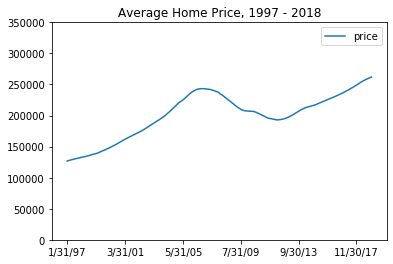

In [50]:
# plot the average price
avg_price.plot()
plt.ylim(0,350000)
plt.title('Average Home Price, 1997 - 2018')
plt.show()

In [46]:
# define a function for accuracy metrics
'''
Inputs = forcasted values, actual values
Output = MAPE, RMSE, MAE
'''
def forecast_accuracy(forecast, actual):
    
    # mean absolute percent error
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))

    # root mean square error
    rmse = sqrt(np.mean((forecast - actual)**2))
    
    # mean absolute error
    mae = np.mean(np.abs(forecast - actual))
    
    return(mape, rmse, mae)

In [313]:
# create a function to run Prophet across zips
'''
Inputs: train and test set 
Format Required: datetime variable in first column - zip codes across other variables
Outputs:
1. ACF plot
2. PACF plot
3. Forecast plot with confidence interval
4. Plot of 2018 Forecasted vs Actuals
5. Plot forecast with upper and lower bounds
6. Component Forecast plot 
7. Accuracy Metrics - MAPE, RMSE, MAE
'''

# plot acf - pacf
def prophet_output(train, test):
    results = []
    lower = []
    upper = []
    dfrows = []
    mean_y_stuff = []
    # confidence interval = 95%
    for i in range(1, len(train.columns)):
        print('Zipcode: ', train.columns[i])
        # build the prophet df for each zip
        prophet_df = train.iloc[:, np.r_[0, i]]
        prophet_df.columns = ['ds', 'y']
        # build the model
        proph_model = Prophet(interval_width = 0.95)
        # fit the model to the training data
        proph_model.fit(prophet_df)
        # forecast 12 months into the future
        future_dates = proph_model.make_future_dataframe(periods = 12, freq = 'M')
        forecast = proph_model.predict(future_dates)
        # store the predictions
        results.append(forecast['yhat'])
        mean_y_stuff.append({'zip':train.columns[i],
                            'yhat':forecast['yhat'].mean(),
                             'actual':test.iloc[:,i].mean(),
                           'lower':forecast['yhat_lower'].mean(),
                           'upper':forecast['yhat_upper'].mean()})
        
        # ACF plot
        plot_acf(train.iloc[:,i])
        plt.title('ACF Plot (AR)')
        plt.show()
    
        # PACF plot
        plot_pacf(train.iloc[:,i])
        plt.title('PACF Plot (MA)')
        plt.show()
    
        
        # plot the forecast
        plot1 = proph_model.plot(forecast)
        plt.title('Forecast 1997 - 2018')
        plt.xlabel('Year')
        plt.ylabel('House Price')
        plt.show()
        
        # plot components forecast
        plot2 = proph_model.plot_components(forecast)
        plt.suptitle('Forcast Components 1997 - 2018')
        plt.show()
        
        # actual vs predicted
        test.index = forecast.index[-12:]
        test.iloc[:,i].plot(label = 'Actual')
        forecast['yhat'][-12:].plot(label = 'Forecast', style = ':')
        forecast['yhat_lower'][-12:].plot(label = 'Lower Bound', style = '--', color = 'red')
        forecast['yhat_upper'][-12:].plot(label = 'Upper Bound', style = '--', color = 'green')
        plt.title('Forecast vs Actuals 2018')
        plt.xticks(ticks = forecast.index[-12:],
                   labels = test['ds'],
                  rotation = '45')

        #plt.ylim(300000, 400000)
        plt.legend(loc = 'best')
        plt.show()
        pred = results[0][-12:]
        pred.index = range(len(pred))
        
        # plot forecast with upper and lower bounds
        plt.figure(figsize = (15, 8))
        plt.plot(forecast['yhat'], label = 'Forecast')
        plt.plot(forecast['yhat_lower'], label = 'Lower Bound')
        plt.plot(forecast['yhat_upper'], label = 'Upper Bound')
        plt.plot(train.iloc[:,i], label = 'Actual')
        plt.xticks(ticks = forecast.index[::12],
                  labels = train['ds'][::12],
                  rotation = '45')
        plt.xlabel('Time')
        plt.ylabel('House Prices')
        plt.title('Forecast of Monthly House Prices')
        plt.legend(loc = 'best')
        plt.show()
        
        # get the actual 2018 data
        # create and reindex a series for evaluation metrics
        act = test.iloc[:,i]
        act.index = range(len(act))
        # store evaluation metrics
        f = forecast_accuracy(pred, act)
        #print(testingdf.columns[i], 'mape:', f[0], 'rmse:', f[1])
        # create a dictionary of zip and evaluation metrics for a df
        dfrows.append({'zip':train.columns[i],
                       'mape':f[0],
                       'rmse':f[1],
                      'mae':f[2]})
        #print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
        #print('ziptrain:', train.columns[i],
         #     'ziptest: ', test.columns[i], 'mape: %.5f'% f[0], 'rmse: %.3f' % f[1], 'mae: %.3f' % f[2])
        prophet_resultsdf = pd.DataFrame(dfrows)
        pred_df = pd.DataFrame(mean_y_stuff)
    return prophet_resultsdf, pred_df

In [146]:
# get the train (1997 - 2017) and test (2018) sets
# train
avg_train = avg_price.loc['1/31/97':'12/31/17']
avg_train.insert(0, 'ds', avg_train.index)
# convert to date time without the time
avg_train['ds'] = pd.to_datetime(avg_train['ds']).dt.date

# test
avg_test = avg_price.loc['1/31/18':'12/31/18']
avg_test.insert(0, 'ds', avg_test.index)

In [137]:
k = pd.to_datetime('1/31/97').date()

print(k)

1997-01-31


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Zipcode:  price


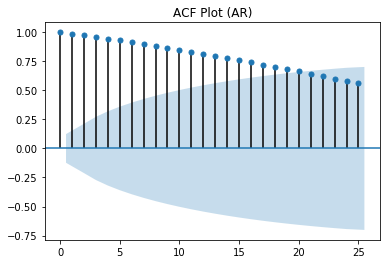

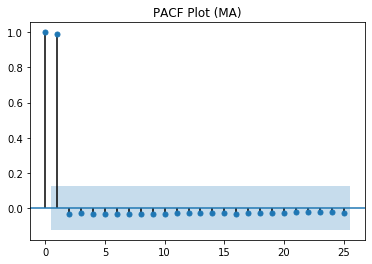

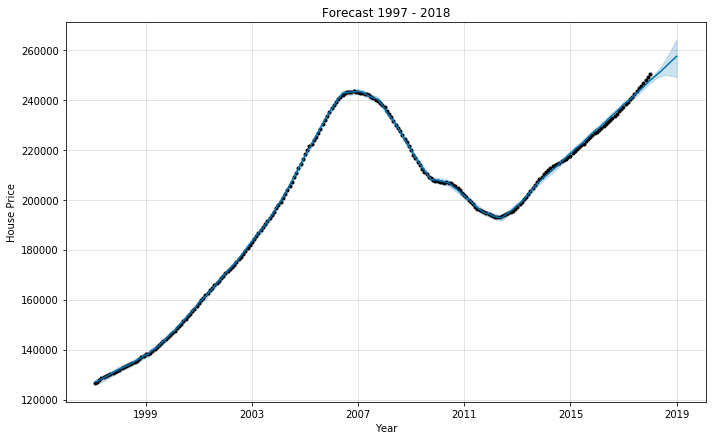

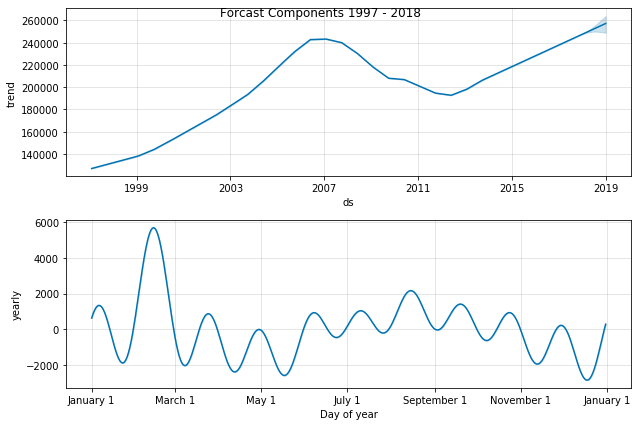

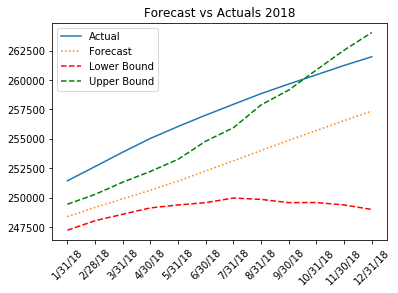

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


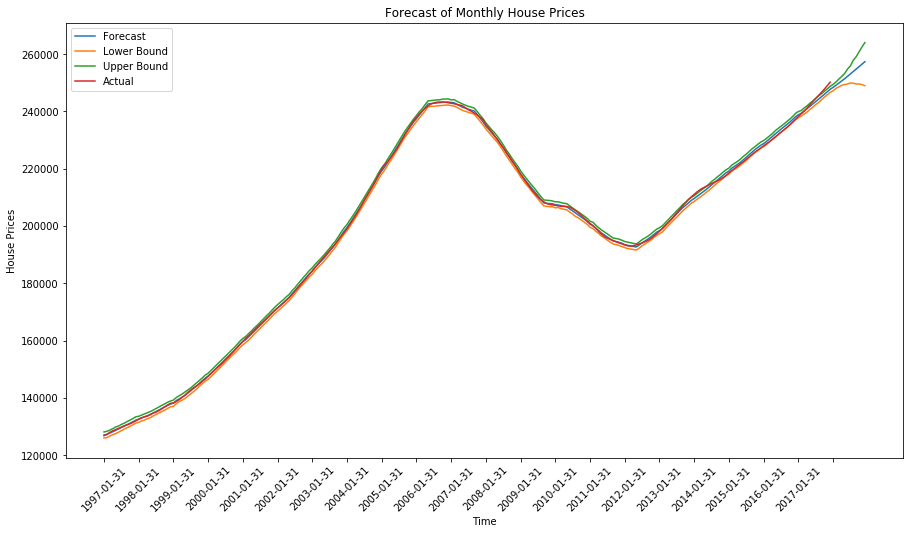

In [314]:
# baseline prophet results
avg_res, avg_pred = prophet_output(avg_train, avg_test)

In [60]:
avg_res

,zip,mape,rmse,mae
0,price,0.017054,4427.04978,4391.122875


In [317]:
4427.05/avg_price['1/31/18':'12/31/18'].mean()

price    0.017214
dtype: float64

The baseline metrics are: 
- MAPE: 0.017
- RMSE: 4427.05 
- MAE: 4391.12

## Prophet on all 14591 zip codes

In [74]:
# use dft 
dft.head()

RegionName,01002,01005,01007,01012,01026,01027,01029,01031,01032,01033,01035,01037,01038,01039,01050,01053,01054,01060,01062,01063,01066,01068,01070,01072,01073,01075,01082,01083,01084,01088,01092,01093,01096,01098,01201,01202,01220,01222,01223,01224,01225,01226,01230,01235,01236,01237,01238,01240,01242,01243,01244,01245,01247,01253,01254,01255,01256,01257,01258,01259,01262,01264,01266,01267,01270,01301,01330,01331,01337,01338,01339,01340,01341,01342,01343,01344,01346,01347,01349,01350,01351,01354,01355,01360,01364,01366,01367,01368,01370,01373,01375,01376,01378,01379,01420,01430,01431,01432,01434,01436,01440,01450,01451,01452,01453,01460,01462,01463,01464,01468,01469,01473,01474,01475,01501,01503,01504,01505,01506,01507,01510,01515,01516,01518,01519,01520,01522,01523,01524,01527,01529,01531,01532,01534,01535,01536,01537,01540,01541,01542,01543,01545,01550,01560,01562,01564,01566,01568,01569,01570,01571,01581,01583,01585,01588,01590,01602,01603,01604,01605,01606,01607,01608,01609,01610,01611,01612,01701,01702,01718,01719,01720,01721,01730,01740,01741,01742,01745,01746,01747,01748,01749,01752,01754,01756,01757,01760,01770,01772,01773,01775,01776,01778,01801,01803,01810,01821,01824,01826,01827,01830,01832,01833,01834,01835,01840,01841,01842,01843,01844,01845,01850,01851,01852,01854,01860,01862,01863,01864,01867,01876,01879,01880,01886,01887,01890,01901,01902,01904,01905,01906,01907,01908,01913,01915,01921,01922,01923,01929,01930,01938,01940,01944,01945,01949,01950,01951,01952,01960,01966,01969,01970,01982,01983,01984,01985,02019,02020,02021,02025,02026,02030,02032,02035,02038,02043,02045,02047,02048,02050,02051,02052,02053,02054,02056,02059,02061,02062,02066,02067,02071,02072,02081,02090,02093,02108,02109,02110,02111,02112,02113,02114,02115,02116,02118,02119,02120,02121,02122,02124,02125,02126,02127,02128,02129,02130,02131,02132,02134,02135,02136,02138,02139,02140,02141,02142,02143,02144,02145,02148,02149,02150,02151,02152,02155,02169,02170,02171,02176,02180,02184,02186,02188,02189,02190,02191,02210,02215,02301,02302,02322,02324,02330,02332,02333,02334,02338,02339,02341,02343,02346,02347,02350,02351,02356,02359,02360,02364,02367,02368,02370,02375,02379,02382,02420,02421,02445,02446,02451,02452,02453,02454,02458,02459,02460,02461,02462,02464,02465,02466,02467,02468,02472,02474,02476,02478,02481,02482,02492,02493,02494,02532,02534,02536,02537,02538,02540,02543,02556,02558,02559,02561,02562,02563,02571,02576,02601,02630,02631,02632,02633,02635,02637,02638,02639,02641,02642,02644,02645,02646,02648,02649,02650,02652,02653,02655,02657,02659,02660,02664,02666,02667,02668,02670,02671,02673,02675,02702,02703,02714,02715,02717,02718,02719,02720,02721,02722,02723,02724,02725,02726,02738,02739,02740,02743,02744,02745,02746,02747,02748,02760,02762,02763,02764,02766,02767,02769,02770,02771,02777,02779,02780,02790,02791,02804,02806,02807,02808,02809,02812,02813,02816,02817,02818,02822,02827,02832,02833,02835,02836,02837,02840,02842,02852,02871,02872,02873,02874,02875,02877,02878,02879,02881,02882,02885,02886,02888,02889,02891,02892,02893,02894,02898,03031,03032,03033,03034,03036,03037,03038,03042,03043,03044,03045,03046,03047,03048,03049,03051,03052,03053,03054,03055,03057,03060,03062,03063,03064,03070,03071,03076,03077,03079,03082,03084,03086,03087,03101,03102,03103,03104,03106,03109,03110,03215,03216,03217,03218,03220,03221,03222,03223,03224,03225,03226,03227,03229,03230,03233,03234,03235,03237,03240,03241,03242,03243,03244,03245,03246,03249,03251,03253,03254,03255,03256,03257,03258,03259,03260,03261,03262,03263,03264,03266,03268,03269,03273,03275,03276,03278,03279,03280,03281,03282,03284,03285,03287,03290,03291,03293,03301,03303,03304,03307,03431,03440,03441,03442,03443,03444,03445,03446,03447,03448,03449,03450,03451,03452,03455,03456,03457,03458,03461,03462,03464,03465,03466,03467,03470,03561,03570,03574,03576,03579,03580,03581,03582,03583,03584,03585,03586,03588,03590,03592,03593,03595,03598,03601,03602,03603,03605,03607,03608,03609,03740

In [149]:
# insert the 'ds' column for Prophet
dft.insert(0, 'ds', dft.index)

# convert to datetime format 
dft['ds'] = pd.to_datetime(dft['ds']).dt.date
dft.head()

RegionName,ds,01002,01005,01007,01012,01026,01027,01029,01031,01032,01033,01035,01037,01038,01039,01050,01053,01054,01060,01062,01063,01066,01068,01070,01072,01073,01075,01082,01083,01084,01088,01092,01093,01096,01098,01201,01202,01220,01222,01223,01224,01225,01226,01230,01235,01236,01237,01238,01240,01242,01243,01244,01245,01247,01253,01254,01255,01256,01257,01258,01259,01262,01264,01266,01267,01270,01301,01330,01331,01337,01338,01339,01340,01341,01342,01343,01344,01346,01347,01349,01350,01351,01354,01355,01360,01364,01366,01367,01368,01370,01373,01375,01376,01378,01379,01420,01430,01431,01432,01434,01436,01440,01450,01451,01452,01453,01460,01462,01463,01464,01468,01469,01473,01474,01475,01501,01503,01504,01505,01506,01507,01510,01515,01516,01518,01519,01520,01522,01523,01524,01527,01529,01531,01532,01534,01535,01536,01537,01540,01541,01542,01543,01545,01550,01560,01562,01564,01566,01568,01569,01570,01571,01581,01583,01585,01588,01590,01602,01603,01604,01605,01606,01607,01608,01609,01610,01611,01612,01701,01702,01718,01719,01720,01721,01730,01740,01741,01742,01745,01746,01747,01748,01749,01752,01754,01756,01757,01760,01770,01772,01773,01775,01776,01778,01801,01803,01810,01821,01824,01826,01827,01830,01832,01833,01834,01835,01840,01841,01842,01843,01844,01845,01850,01851,01852,01854,01860,01862,01863,01864,01867,01876,01879,01880,01886,01887,01890,01901,01902,01904,01905,01906,01907,01908,01913,01915,01921,01922,01923,01929,01930,01938,01940,01944,01945,01949,01950,01951,01952,01960,01966,01969,01970,01982,01983,01984,01985,02019,02020,02021,02025,02026,02030,02032,02035,02038,02043,02045,02047,02048,02050,02051,02052,02053,02054,02056,02059,02061,02062,02066,02067,02071,02072,02081,02090,02093,02108,02109,02110,02111,02112,02113,02114,02115,02116,02118,02119,02120,02121,02122,02124,02125,02126,02127,02128,02129,02130,02131,02132,02134,02135,02136,02138,02139,02140,02141,02142,02143,02144,02145,02148,02149,02150,02151,02152,02155,02169,02170,02171,02176,02180,02184,02186,02188,02189,02190,02191,02210,02215,02301,02302,02322,02324,02330,02332,02333,02334,02338,02339,02341,02343,02346,02347,02350,02351,02356,02359,02360,02364,02367,02368,02370,02375,02379,02382,02420,02421,02445,02446,02451,02452,02453,02454,02458,02459,02460,02461,02462,02464,02465,02466,02467,02468,02472,02474,02476,02478,02481,02482,02492,02493,02494,02532,02534,02536,02537,02538,02540,02543,02556,02558,02559,02561,02562,02563,02571,02576,02601,02630,02631,02632,02633,02635,02637,02638,02639,02641,02642,02644,02645,02646,02648,02649,02650,02652,02653,02655,02657,02659,02660,02664,02666,02667,02668,02670,02671,02673,02675,02702,02703,02714,02715,02717,02718,02719,02720,02721,02722,02723,02724,02725,02726,02738,02739,02740,02743,02744,02745,02746,02747,02748,02760,02762,02763,02764,02766,02767,02769,02770,02771,02777,02779,02780,02790,02791,02804,02806,02807,02808,02809,02812,02813,02816,02817,02818,02822,02827,02832,02833,02835,02836,02837,02840,02842,02852,02871,02872,02873,02874,02875,02877,02878,02879,02881,02882,02885,02886,02888,02889,02891,02892,02893,02894,02898,03031,03032,03033,03034,03036,03037,03038,03042,03043,03044,03045,03046,03047,03048,03049,03051,03052,03053,03054,03055,03057,03060,03062,03063,03064,03070,03071,03076,03077,03079,03082,03084,03086,03087,03101,03102,03103,03104,03106,03109,03110,03215,03216,03217,03218,03220,03221,03222,03223,03224,03225,03226,03227,03229,03230,03233,03234,03235,03237,03240,03241,03242,03243,03244,03245,03246,03249,03251,03253,03254,03255,03256,03257,03258,03259,03260,03261,03262,03263,03264,03266,03268,03269,03273,03275,03276,03278,03279,03280,03281,03282,03284,03285,03287,03290,03291,03293,03301,03303,03304,03307,03431,03440,03441,03442,03443,03444,03445,03446,03447,03448,03449,03450,03451,03452,03455,03456,03457,03458,03461,03462,03464,03465,03466,03467,03470,03561,03570,03574,03576,03579,03580,03581,03582,03583,03584,03585,03586,03588,03590,03592,03593,03595,03598,03601,03602,03603,03605,03607,03608,03609,03

In [150]:
# want to train on 97 - 17 and test on 18
train = dft.loc['1/31/97':'12/31/17', :]
test = dft.loc['1/31/18':'12/31/18', :]

In [77]:
train.tail()

RegionName,ds,01002,01005,01007,01012,01026,01027,01029,01031,01032,01033,01035,01037,01038,01039,01050,01053,01054,01060,01062,01063,01066,01068,01070,01072,01073,01075,01082,01083,01084,01088,01092,01093,01096,01098,01201,01202,01220,01222,01223,01224,01225,01226,01230,01235,01236,01237,01238,01240,01242,01243,01244,01245,01247,01253,01254,01255,01256,01257,01258,01259,01262,01264,01266,01267,01270,01301,01330,01331,01337,01338,01339,01340,01341,01342,01343,01344,01346,01347,01349,01350,01351,01354,01355,01360,01364,01366,01367,01368,01370,01373,01375,01376,01378,01379,01420,01430,01431,01432,01434,01436,01440,01450,01451,01452,01453,01460,01462,01463,01464,01468,01469,01473,01474,01475,01501,01503,01504,01505,01506,01507,01510,01515,01516,01518,01519,01520,01522,01523,01524,01527,01529,01531,01532,01534,01535,01536,01537,01540,01541,01542,01543,01545,01550,01560,01562,01564,01566,01568,01569,01570,01571,01581,01583,01585,01588,01590,01602,01603,01604,01605,01606,01607,01608,01609,01610,01611,01612,01701,01702,01718,01719,01720,01721,01730,01740,01741,01742,01745,01746,01747,01748,01749,01752,01754,01756,01757,01760,01770,01772,01773,01775,01776,01778,01801,01803,01810,01821,01824,01826,01827,01830,01832,01833,01834,01835,01840,01841,01842,01843,01844,01845,01850,01851,01852,01854,01860,01862,01863,01864,01867,01876,01879,01880,01886,01887,01890,01901,01902,01904,01905,01906,01907,01908,01913,01915,01921,01922,01923,01929,01930,01938,01940,01944,01945,01949,01950,01951,01952,01960,01966,01969,01970,01982,01983,01984,01985,02019,02020,02021,02025,02026,02030,02032,02035,02038,02043,02045,02047,02048,02050,02051,02052,02053,02054,02056,02059,02061,02062,02066,02067,02071,02072,02081,02090,02093,02108,02109,02110,02111,02112,02113,02114,02115,02116,02118,02119,02120,02121,02122,02124,02125,02126,02127,02128,02129,02130,02131,02132,02134,02135,02136,02138,02139,02140,02141,02142,02143,02144,02145,02148,02149,02150,02151,02152,02155,02169,02170,02171,02176,02180,02184,02186,02188,02189,02190,02191,02210,02215,02301,02302,02322,02324,02330,02332,02333,02334,02338,02339,02341,02343,02346,02347,02350,02351,02356,02359,02360,02364,02367,02368,02370,02375,02379,02382,02420,02421,02445,02446,02451,02452,02453,02454,02458,02459,02460,02461,02462,02464,02465,02466,02467,02468,02472,02474,02476,02478,02481,02482,02492,02493,02494,02532,02534,02536,02537,02538,02540,02543,02556,02558,02559,02561,02562,02563,02571,02576,02601,02630,02631,02632,02633,02635,02637,02638,02639,02641,02642,02644,02645,02646,02648,02649,02650,02652,02653,02655,02657,02659,02660,02664,02666,02667,02668,02670,02671,02673,02675,02702,02703,02714,02715,02717,02718,02719,02720,02721,02722,02723,02724,02725,02726,02738,02739,02740,02743,02744,02745,02746,02747,02748,02760,02762,02763,02764,02766,02767,02769,02770,02771,02777,02779,02780,02790,02791,02804,02806,02807,02808,02809,02812,02813,02816,02817,02818,02822,02827,02832,02833,02835,02836,02837,02840,02842,02852,02871,02872,02873,02874,02875,02877,02878,02879,02881,02882,02885,02886,02888,02889,02891,02892,02893,02894,02898,03031,03032,03033,03034,03036,03037,03038,03042,03043,03044,03045,03046,03047,03048,03049,03051,03052,03053,03054,03055,03057,03060,03062,03063,03064,03070,03071,03076,03077,03079,03082,03084,03086,03087,03101,03102,03103,03104,03106,03109,03110,03215,03216,03217,03218,03220,03221,03222,03223,03224,03225,03226,03227,03229,03230,03233,03234,03235,03237,03240,03241,03242,03243,03244,03245,03246,03249,03251,03253,03254,03255,03256,03257,03258,03259,03260,03261,03262,03263,03264,03266,03268,03269,03273,03275,03276,03278,03279,03280,03281,03282,03284,03285,03287,03290,03291,03293,03301,03303,03304,03307,03431,03440,03441,03442,03443,03444,03445,03446,03447,03448,03449,03450,03451,03452,03455,03456,03457,03458,03461,03462,03464,03465,03466,03467,03470,03561,03570,03574,03576,03579,03580,03581,03582,03583,03584,03585,03586,03588,03590,03592,03593,03595,03598,03601,03602,03603,03605,03607,03608,03609,03

In [78]:
test.head()

RegionName,ds,01002,01005,01007,01012,01026,01027,01029,01031,01032,01033,01035,01037,01038,01039,01050,01053,01054,01060,01062,01063,01066,01068,01070,01072,01073,01075,01082,01083,01084,01088,01092,01093,01096,01098,01201,01202,01220,01222,01223,01224,01225,01226,01230,01235,01236,01237,01238,01240,01242,01243,01244,01245,01247,01253,01254,01255,01256,01257,01258,01259,01262,01264,01266,01267,01270,01301,01330,01331,01337,01338,01339,01340,01341,01342,01343,01344,01346,01347,01349,01350,01351,01354,01355,01360,01364,01366,01367,01368,01370,01373,01375,01376,01378,01379,01420,01430,01431,01432,01434,01436,01440,01450,01451,01452,01453,01460,01462,01463,01464,01468,01469,01473,01474,01475,01501,01503,01504,01505,01506,01507,01510,01515,01516,01518,01519,01520,01522,01523,01524,01527,01529,01531,01532,01534,01535,01536,01537,01540,01541,01542,01543,01545,01550,01560,01562,01564,01566,01568,01569,01570,01571,01581,01583,01585,01588,01590,01602,01603,01604,01605,01606,01607,01608,01609,01610,01611,01612,01701,01702,01718,01719,01720,01721,01730,01740,01741,01742,01745,01746,01747,01748,01749,01752,01754,01756,01757,01760,01770,01772,01773,01775,01776,01778,01801,01803,01810,01821,01824,01826,01827,01830,01832,01833,01834,01835,01840,01841,01842,01843,01844,01845,01850,01851,01852,01854,01860,01862,01863,01864,01867,01876,01879,01880,01886,01887,01890,01901,01902,01904,01905,01906,01907,01908,01913,01915,01921,01922,01923,01929,01930,01938,01940,01944,01945,01949,01950,01951,01952,01960,01966,01969,01970,01982,01983,01984,01985,02019,02020,02021,02025,02026,02030,02032,02035,02038,02043,02045,02047,02048,02050,02051,02052,02053,02054,02056,02059,02061,02062,02066,02067,02071,02072,02081,02090,02093,02108,02109,02110,02111,02112,02113,02114,02115,02116,02118,02119,02120,02121,02122,02124,02125,02126,02127,02128,02129,02130,02131,02132,02134,02135,02136,02138,02139,02140,02141,02142,02143,02144,02145,02148,02149,02150,02151,02152,02155,02169,02170,02171,02176,02180,02184,02186,02188,02189,02190,02191,02210,02215,02301,02302,02322,02324,02330,02332,02333,02334,02338,02339,02341,02343,02346,02347,02350,02351,02356,02359,02360,02364,02367,02368,02370,02375,02379,02382,02420,02421,02445,02446,02451,02452,02453,02454,02458,02459,02460,02461,02462,02464,02465,02466,02467,02468,02472,02474,02476,02478,02481,02482,02492,02493,02494,02532,02534,02536,02537,02538,02540,02543,02556,02558,02559,02561,02562,02563,02571,02576,02601,02630,02631,02632,02633,02635,02637,02638,02639,02641,02642,02644,02645,02646,02648,02649,02650,02652,02653,02655,02657,02659,02660,02664,02666,02667,02668,02670,02671,02673,02675,02702,02703,02714,02715,02717,02718,02719,02720,02721,02722,02723,02724,02725,02726,02738,02739,02740,02743,02744,02745,02746,02747,02748,02760,02762,02763,02764,02766,02767,02769,02770,02771,02777,02779,02780,02790,02791,02804,02806,02807,02808,02809,02812,02813,02816,02817,02818,02822,02827,02832,02833,02835,02836,02837,02840,02842,02852,02871,02872,02873,02874,02875,02877,02878,02879,02881,02882,02885,02886,02888,02889,02891,02892,02893,02894,02898,03031,03032,03033,03034,03036,03037,03038,03042,03043,03044,03045,03046,03047,03048,03049,03051,03052,03053,03054,03055,03057,03060,03062,03063,03064,03070,03071,03076,03077,03079,03082,03084,03086,03087,03101,03102,03103,03104,03106,03109,03110,03215,03216,03217,03218,03220,03221,03222,03223,03224,03225,03226,03227,03229,03230,03233,03234,03235,03237,03240,03241,03242,03243,03244,03245,03246,03249,03251,03253,03254,03255,03256,03257,03258,03259,03260,03261,03262,03263,03264,03266,03268,03269,03273,03275,03276,03278,03279,03280,03281,03282,03284,03285,03287,03290,03291,03293,03301,03303,03304,03307,03431,03440,03441,03442,03443,03444,03445,03446,03447,03448,03449,03450,03451,03452,03455,03456,03457,03458,03461,03462,03464,03465,03466,03467,03470,03561,03570,03574,03576,03579,03580,03581,03582,03583,03584,03585,03586,03588,03590,03592,03593,03595,03598,03601,03602,03603,03605,03607,03608,03609,03

In [152]:
############################################################################
#
# CAUTION - this took my machine 33642.438962 seconds or 9.34 hours to run
#
#############################################################################

# Prophet on all 14591 zip codes

# stores the mape and rmse with zip in dictionaries. creates a dataframe from it
t1_start = process_time()
results = []
dfrows = []
# confidence interval = 95%
for i in range(1, len(train.columns)):
    #print(i)
    # build the prophet df for each zip
    prophet_df = train.iloc[:, np.r_[0, i]]
    prophet_df.columns = ['ds', 'y']
    # build the model
    proph_model = Prophet(interval_width = 0.95)
    # fit the model to the training data
    proph_model.fit(prophet_df)
    # forecast 12 months into the future
    future_dates = proph_model.make_future_dataframe(periods = 12, freq = 'M')
    forecast = proph_model.predict(future_dates)
    # store the predictions
    results.append(forecast['yhat'])
    # 2018 predictions are the last 12
    # create and reindex a series for evaluation metrics
    pred = results[0][-12:]
    pred.index = range(len(pred))
    # get the actual 2018 data
    # create and reindex a series for evaluation metrics
    act = test.iloc[:,i]
    act.index = range(len(act))
    # store evaluation metrics
    f = forecast_accuracy(pred,act)
    #print(testingdf.columns[i], 'mape:', f[0], 'rmse:', f[1])
    # create a dictionary of zip and evaluation metrics for a df
    dfrows.append({'zip':train.columns[i],
                   'mape':f[0],
                   'rmse':f[1],
                  'mae':f[2]})
    #print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
    print('ziptrain:', train.columns[i],
          'ziptest: ', test.columns[i], 'mape: %.5f'% f[0], 'rmse: %.3f' % f[1], 'mae: %.3f' % f[2])
prophet_resultsdf = pd.DataFrame(dfrows)
t1_stop = process_time()
print('Elapsed time (sec):', t1_stop - t1_start)

prophet_resultsdf.sort_values('rmse')

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


ziptrain: 01002 ziptest:  01002 mape: 0.03855 rmse: 14454.758 mae: 13966.186


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


ziptrain: 01005 ziptest:  01005 mape: 0.51739 rmse: 118350.402 mae: 118323.564


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


ziptrain: 01007 ziptest:  01007 mape: 0.21695 rmse: 61903.238 mae: 61858.814


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


ziptrain: 01012 ziptest:  01012 mape: 0.44907 rmse: 107593.207 mae: 107561.148


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


ziptrain: 01026 ziptest:  01026 mape: 0.49430 rmse: 114849.032 mae: 114792.148


KeyboardInterrupt: 

In [ ]:
zipsdf = prophet_resultsdf.sort_values('rmse')[:10]
zipsdf
# save to csv
#zipsdf.to_csv('zipsRMSE.csv')
#prophet_resultsdf.to_csv('allzipsfromprophet.csv')

#### _Only use this if you did NOT run Prophet for all zips_

In [83]:
# only use this if you did NOT run Prophet

# read in the results
zipsdf = pd.read_csv('allzipsfromprophet.csv')

# get the 10 zips with the lowest RMSE
zipsdf = zipsdf.sort_values('rmse')[:10]
zipsdf

,Unnamed: 0,zip,mape,rmse,mae
1827,1827,8850,0.001573,651.443321,546.561585
3980,3980,22911,0.002987,1209.415356,1033.901639
1582,1582,7737,0.002976,1229.009919,1036.511710
3636,3636,21014,0.003004,1256.605332,1041.840819
1262,1262,6033,0.003431,1348.513684,1195.734576
14433,14433,97216,0.003654,1482.749472,1269.095735
6721,6721,37206,0.002774,1516.599794,958.994498
10419,10419,60585,0.004389,1666.015910,1524.065807
10306,10306,60187,0.004202,1727.179816,1451.363541
3945,3945,22740,0.004087,1954.898465,1409.775790


In [ ]:
#drop 'Unnamed:0'
zipsdf.drop('Unnamed: 0', axis = 1, inplace = True)

#### _Start here if you ran Prophet for all zips_

In [88]:
# reindex
zipsdf.index = range(len(zipsdf))

# convert zips to string 
zipsdf['zip'] = zipsdf['zip'].apply(str)

# fill in 0s
for i in range(len(zipsdf)):
    zcode = zipsdf['zip'][i]
    new_zcode = zcode.zfill(5)
    zipsdf['zip'][i] = new_zcode

zipsdf

,zip,mape,rmse,mae
0,08850,0.001573,651.443321,546.561585
1,22911,0.002987,1209.415356,1033.901639
2,07737,0.002976,1229.009919,1036.511710
3,21014,0.003004,1256.605332,1041.840819
4,06033,0.003431,1348.513684,1195.734576
5,97216,0.003654,1482.749472,1269.095735
6,37206,0.002774,1516.599794,958.994498
7,60585,0.004389,1666.015910,1524.065807
8,60187,0.004202,1727.179816,1451.363541
9,22740,0.004087,1954.898465,1409.775790


In [91]:
# combine demographic data with zip perfomance

# convert zips to string and fill in 0s for demo
demo['zip'] = demo['zip'].apply(str)
for i in range(len(demo)):
    zcode = demo['zip'][i]
    new_zcode = zcode.zfill(5)
    demo['zip'][i] = new_zcode
demo.head()

,zip,Median Income,Cost Of Living Index,Median Mortgage To Income Ratio (%),Owner Occupied Homes (%),Median Rooms In Home,College Degree (%),Professional (%),Population,Average Household Size,Median Age,Male To Female Ratio (%),Married (%),Divorced (%),White (%),Black (%),Asian (%),Hispanic Ethnicity (%)
0,08850,"71,817",201.6,22.3,84.9,6.6,29.9,40.1,"8,460",2.7,40.3,92.2,61.4,6.2,90.6,0.5,4.4,3.8
1,22911,"63,673",190.3,19.8,75.5,6.9,51.0,54.6,"11,965",2.7,36.2,87.0,69.0,8.1,87.5,7.5,2.7,0.9
2,07737,"72,718",193.2,24.0,89.2,6.6,26.7,36.4,"4,445",2.9,37.5,93.1,60.3,7.8,94.4,1.0,0.4,2.5
3,21014,"61,472",177.0,22.4,79.4,6.9,36.9,43.8,"32,969",2.6,37.3,88.1,65.6,7.2,93.1,2.9,1.5,1.4
4,06033,"77,991",229.5,20.2,79.8,6.7,53.9,56.4,"27,253",2.5,39.9,84.2,66.2,8.5,90.5,1.5,3.9,2.6


In [391]:
# merge prophet performance - demo data on zipcode
pr_demo = pd.merge(left = zipsdf, right = demo, left_on = 'zip', right_on = 'zip', how = 'inner' )

# merge previous with labor info
top10df = pd.merge(left = pr_demo, right = mergedf, left_on = 'zip', right_on = 'RegionName', how = 'inner' )

# drop house price info
top10df.drop(top10df.loc[:, '1/31/97':'3/31/20'], axis = 1, inplace = True)


In [387]:
# convert a string to a float
def convert_to_int(series):
    for i in range(len(series)):
        inc_str = re.sub(',','', series[i])
        inc_num = int(inc_str)
        return inc_num

In [401]:
for i in range(len(top10df)):
    blah = top10df['Median Income'][i]
    inc_str = re.sub(',', '', blah)
    inc_num = int(inc_str)
    top10df['Median Income'][i] = inc_num

In [512]:
# reate data frams fro distribution plots
med_inc = pd.DataFrame(zip(top10df['zip'], top10df['Median Income']),
                          columns = ['zip', 'med inc'])

unemp = pd.DataFrame(zip(top10df['zip'], top10df['unemployment_rate']),
                      columns = ['zip', 'unemployment_rate'])

col_deg = pd.DataFrame(zip(top10df['zip'], top10df['College Degree (%)']), 
                      columns = ['zip', 'ratio'])

med_age = pd.DataFrame(zip(top10df['zip'], top10df['Median Age']),
                      columns = ['zip', 'age'])

size_rank = pd.DataFrame(zip(top10df['zip'], top10df['SizeRank']),
                        columns = ['zip', 'sizerank'])

married = pd.DataFrame(zip(top10df['zip'], top10df['Married (%)']), 
                      columns = ['zip', 'married'])

In [500]:
top10df.columns

Index(['zip', 'mape', 'rmse', 'mae', 'Median Income', 'Cost Of Living Index',
       'Median Mortgage To Income Ratio (%)', 'Owner Occupied Homes (%)',
       'Median Rooms In Home', 'College Degree (%)', 'Professional (%)',
       'Population', 'Average Household Size', 'Median Age',
       'Male To Female Ratio (%)', 'Married (%)', 'Divorced (%)', 'White (%)',
       'Black (%)', 'Asian (%)', 'Hispanic Ethnicity (%)', 'SizeRank',
       'RegionName', 'StateName', 'State', 'City', 'Metro', 'CountyName',
       'LAUSCode', 'StateCode', 'CountyCode', 'County Name/State Abbreviation',
       'year', 'labor _force', 'employed', 'unemployed', 'unemployment_rate',
       'county', 'state'],
      dtype='object')

# Distribution Plots of Relavent Variables

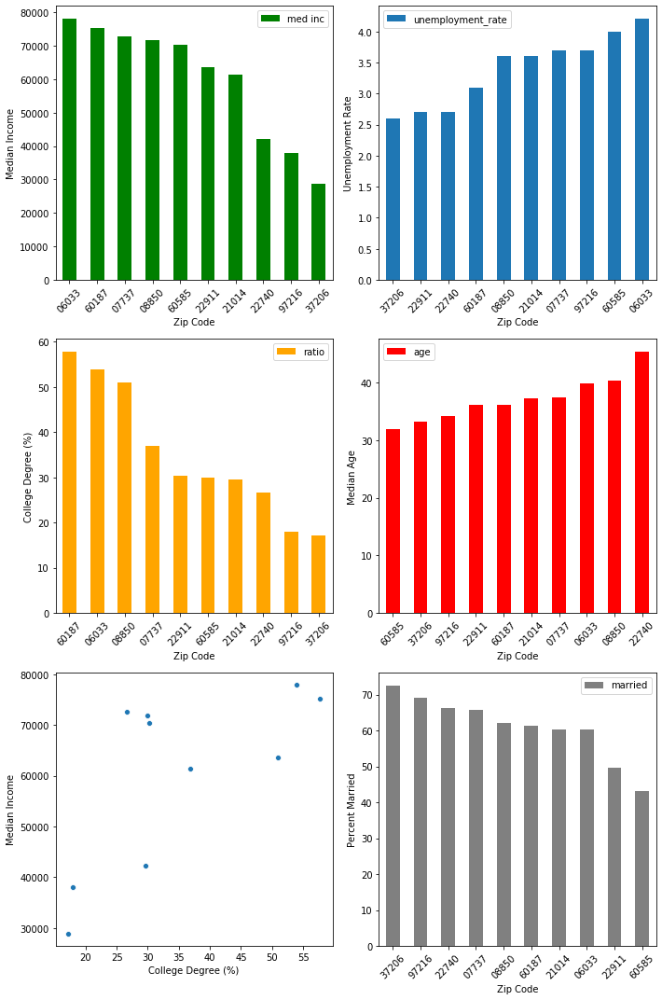

In [516]:
plt.rcParams.update({'figure.figsize':(10,15)})
# want a 4x2 grid
fig, axes = plt.subplots(3, 2)

# Median Income
med_inc.sort_values('med inc', ascending = False).plot(kind = 'bar', ax = axes[0,0], color = 'green')
axes[0,0].set_xticks(ticks = list(range(0,10)))
axes[0,0].set_xticklabels(labels = med_inc.sort_values('med inc', ascending = False).zip , rotation = '45')
axes[0,0].set_xlabel('Zip Code')
axes[0,0].set_ylabel('Median Income')

# Cost of Living Index
unemp.sort_values('unemployment_rate', ascending = True).plot(kind = 'bar', ax = axes[0,1])
axes[0,1].set_xticks(ticks = list(range(0,10)))
axes[0,1].set_xticklabels(labels = unemp.sort_values('unemployment_rate', ascending = True).zip , rotation = '45')
axes[0,1].set_xlabel('Zip Code')
axes[0,1].set_ylabel('Unemployment Rate')

# College Degree
col_deg.sort_values('ratio', ascending = False).plot(kind = 'bar', ax = axes[1,0], color = 'orange')
axes[1,0].set_xticks(ticks = list(range(0,10)))
axes[1,0].set_xticklabels(labels = col.sort_values('col', ascending = False).zip , rotation = '45')
axes[1,0].set_xlabel('Zip Code')
axes[1,0].set_ylabel('College Degree (%)')

# Median Age
med_age.sort_values('age', ascending = True).plot(kind = 'bar', ax = axes[1,1], color = 'red')
axes[1,1].set_xticks(ticks = list(range(0,10)))
axes[1,1].set_xticklabels(labels = med_age.sort_values('age', ascending = True).zip , rotation = '45')
axes[1,1].set_xlabel('Zip Code')
axes[1,1].set_ylabel('Median Age')

# Percent Married
married.sort_values('married', ascending = False).plot(kind = 'bar', ax = axes[2,1], color = 'grey')
axes[2,1].set_xticks(ticks = list(range(0,10)))
axes[2,1].set_xticklabels(labels = married.sort_values('married', ascending = True).zip , rotation = '45')
axes[2,1].set_xlabel('Zip Code')
axes[2,1].set_ylabel('Percent Married')

# College Degree vs Median Income
sns.scatterplot(x = 'College Degree (%)', y = 'Median Income', data = top10df, ax = axes[2,0])


plt.tight_layout()
plt.show()


# Prophet for the Top 3 Zip Codes

In [526]:
# train data
top_3_train = train[['ds', '22911', '08850', '60585']]
# test data
top_3_test = test[['ds', '22911', '08850', '60585']]

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Zipcode:  22911


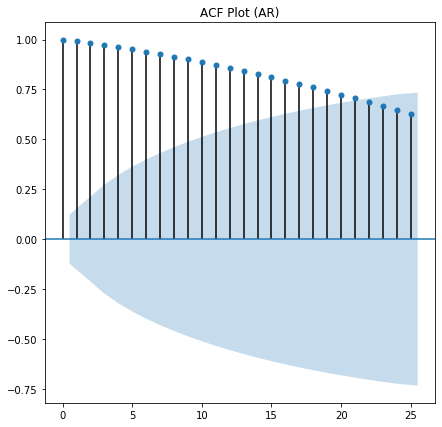

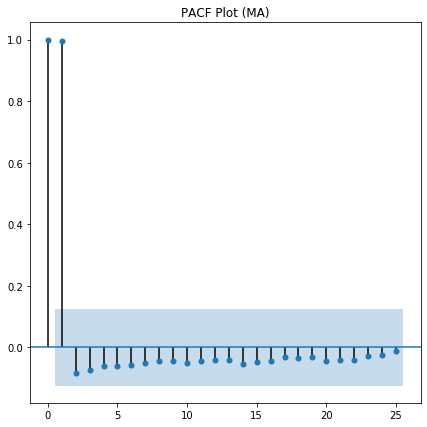

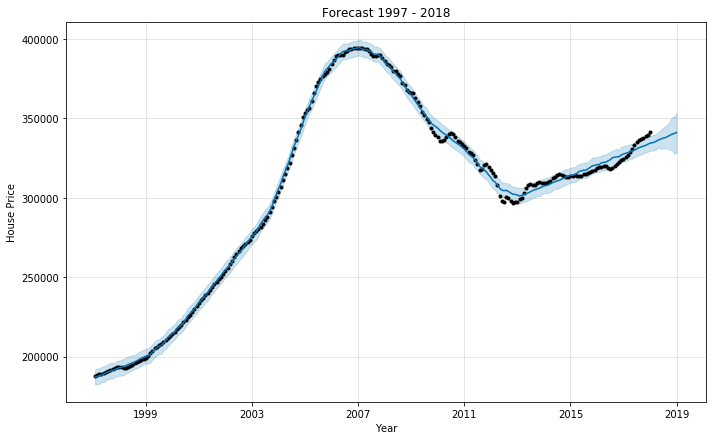

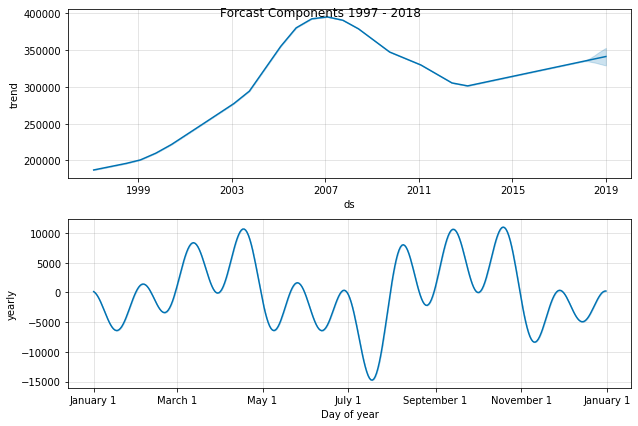

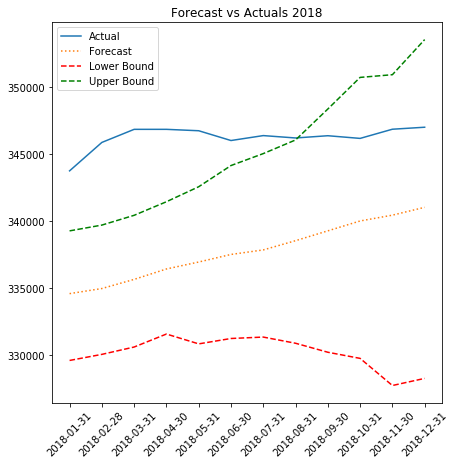

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


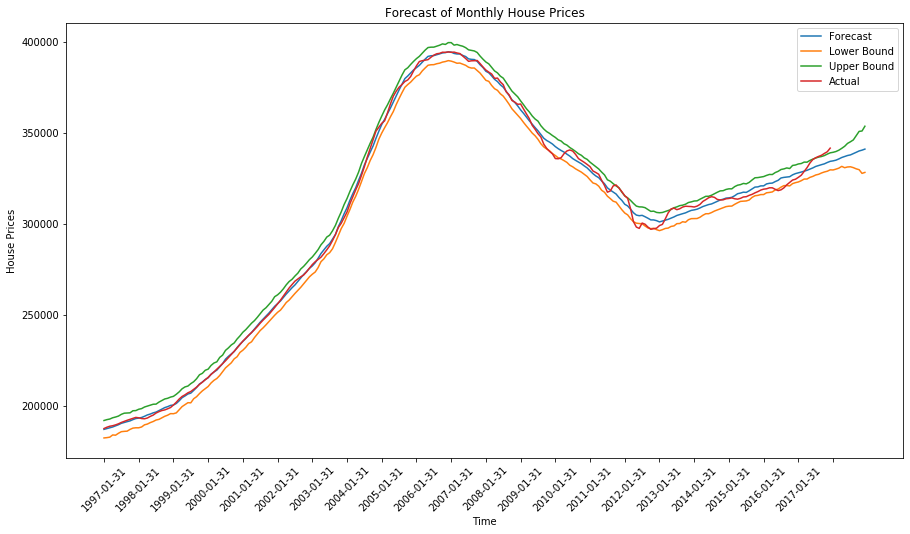

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Zipcode:  08850


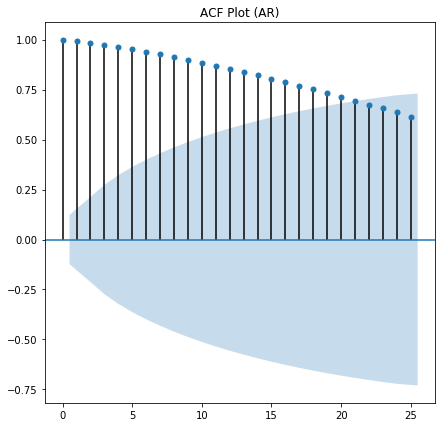

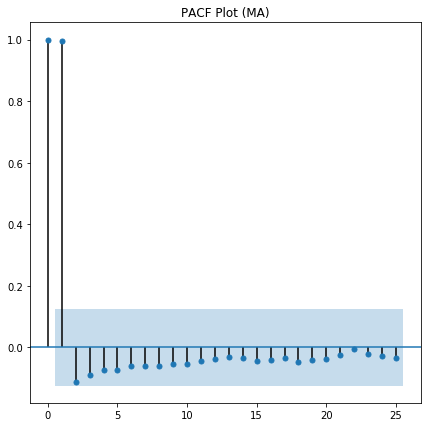

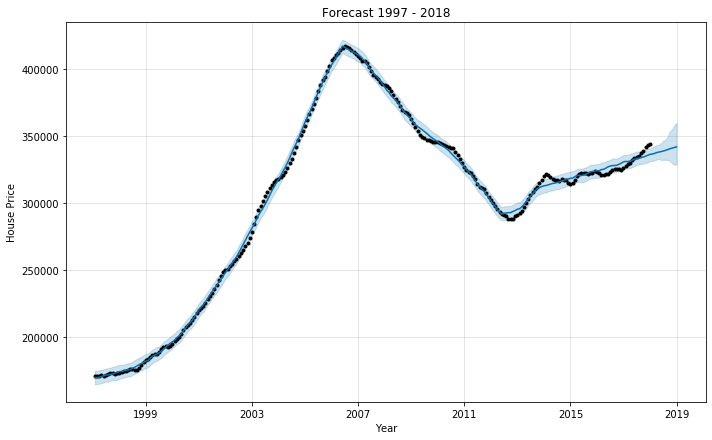

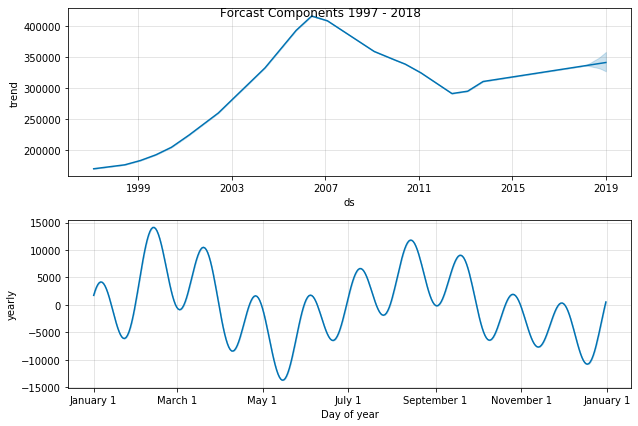

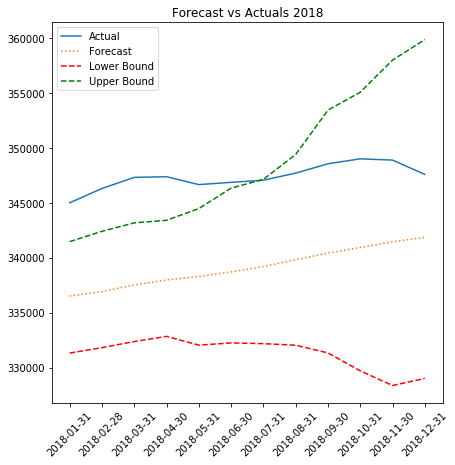

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


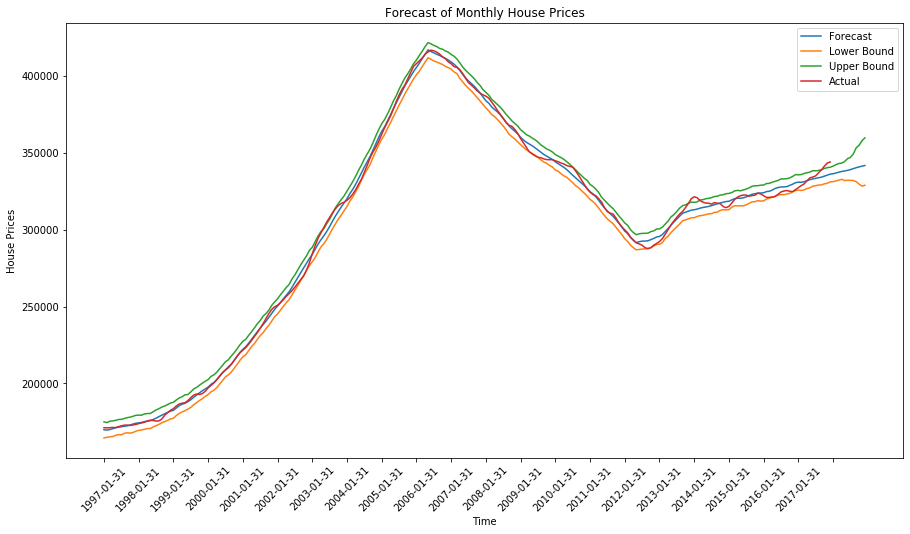

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Zipcode:  60585


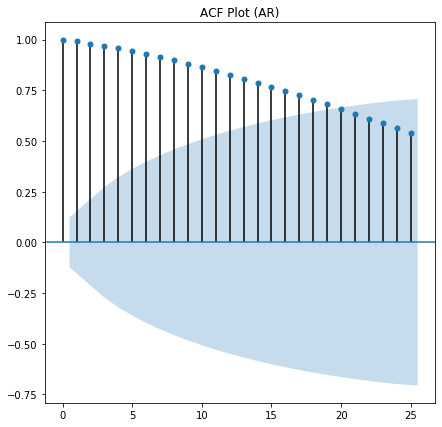

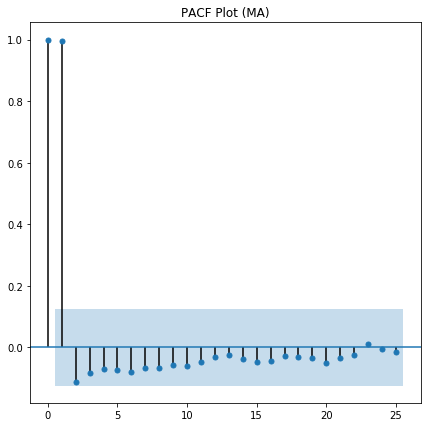

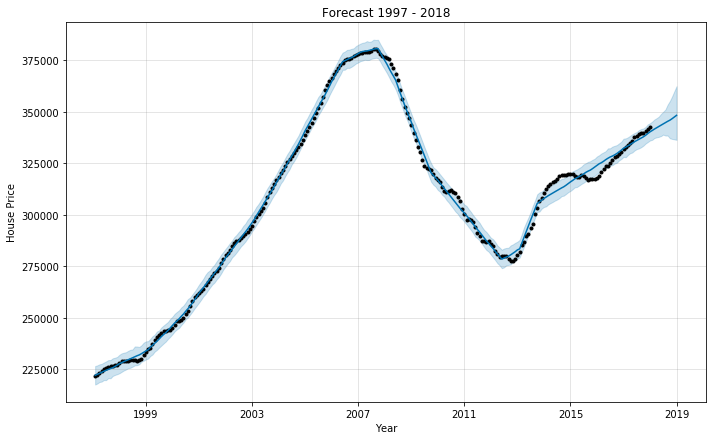

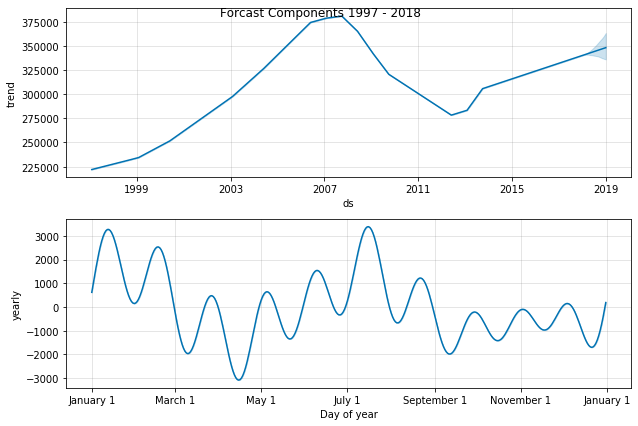

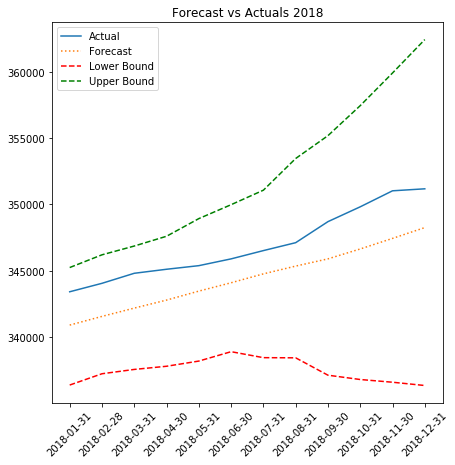

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


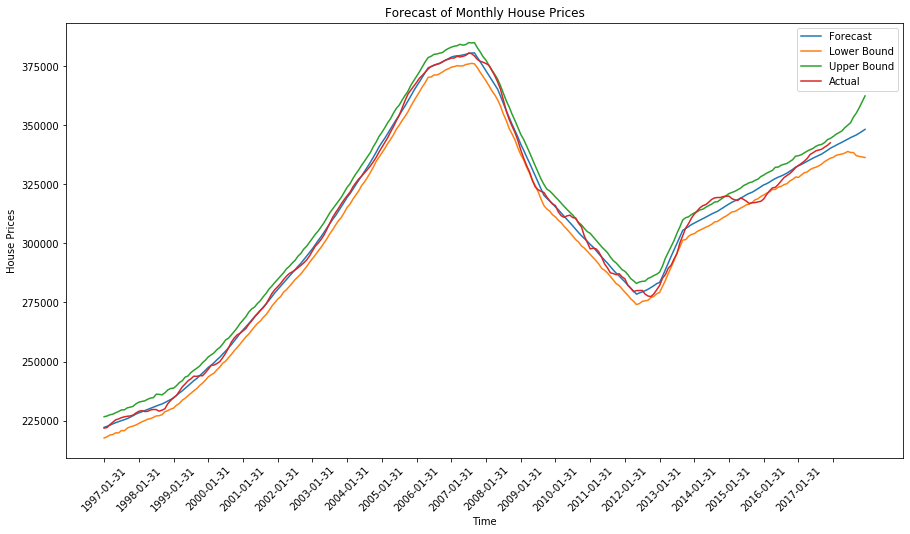

In [529]:
# run Prophet
plt.rcParams.update({'figure.figsize':(7,7)})


resdf, predf = prophet_output(top_3_train, top_3_test)

In [524]:
# get the top 3 zips data
top_3df = top10df.loc[top10df['zip'].isin(['22911', '08850', '60585'])]
top_3df

,zip,mape,rmse,mae,Median Income,Cost Of Living Index,Median Mortgage To Income Ratio (%),Owner Occupied Homes (%),Median Rooms In Home,College Degree (%),Professional (%),Population,Average Household Size,Median Age,Male To Female Ratio (%),Married (%),Divorced (%),White (%),Black (%),Asian (%),Hispanic Ethnicity (%),SizeRank,RegionName,StateName,State,City,Metro,CountyName,LAUSCode,StateCode,CountyCode,County Name/State Abbreviation,year,labor _force,employed,unemployed,unemployment_rate,county,state
0,08850,0.001573,651.443321,546.561585,71817,201.6,22.3,84.9,6.6,29.9,40.1,"8,460",2.7,40.3,92.2,61.4,6.2,90.6,0.5,4.4,3.8,11125,08850,NJ,NJ,Milltown,New York-Newark-Jersey City,middlesex county,CN3402300000000,34.0,23.0,"Middlesex County, NJ",2018.0,"435,053","419,262","15,791",3.6,middlesex county,NJ
1,22911,0.002987,1209.415356,1033.901639,63673,190.3,19.8,75.5,6.9,51.0,54.6,"11,965",2.7,36.2,87.0,69.0,8.1,87.5,7.5,2.7,0.9,6399,22911,VA,VA,Charlottesville,Charlottesville,albemarle county,CN5100300000000,51.0,3.0,"Albemarle County, VA",2018.0,"55,903","54,408","1,495",2.7,albemarle county,VA
7,60585,0.004389,1666.015910,1524.065807,70417,187.0,23.9,94.6,6.6,30.3,37.9,"43,958",2.9,31.9,93.7,72.6,5.5,88.7,1.8,2.1,6.1,6788,60585,IL,IL,Plainfield,Chicago-Naperville-Elgin,will county,CN1719700000000,17.0,197.0,"Will County, IL",2018.0,"357,226","342,785","14,441",4.0,will county,IL


In [525]:
keep_cols = ['zip','mape', 'mae', 'Median Income', 'Median Age', 'College Degree (%)', 'Professional (%)', 'Married (%)', 'unemployment_rate', 'county', 'state']
top_3df = top_3df[keep_cols]
top_3df

,zip,mape,mae,Median Income,Median Age,College Degree (%),Professional (%),Married (%),unemployment_rate,county,state
0,08850,0.001573,546.561585,71817,40.3,29.9,40.1,61.4,3.6,middlesex county,NJ
1,22911,0.002987,1033.901639,63673,36.2,51.0,54.6,69.0,2.7,albemarle county,VA
7,60585,0.004389,1524.065807,70417,31.9,30.3,37.9,72.6,4.0,will county,IL


In [530]:
predf

,zip,yhat,actual,lower,upper
0,22911,305338.741125,346273.75,300403.579260,310267.478169
1,08850,304244.643718,347339.50,299109.590056,309462.100248
2,60585,307332.359027,346922.50,302906.952984,311787.525063
